<font face="cursive" size="6.5">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Red Wine Quality Prediction Project
</span>

</font>



## Project Description
The dataset is related to red and white variants of the Portuguese "Vinho Verde" wine. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

This dataset can be viewed as classification task. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.

#### Attribute Information
Input variables (based on physicochemical tests):
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data):
- 12 - quality (score between 0 and 10)

What might be an interesting thing to do, is to set an arbitrary cutoff for your dependent variable (wine quality) at e.g. 7 or higher getting classified as 'good/1' and the remainder as 'not good/0'.
This allows you to practice with hyper parameter tuning on e.g. decision tree algorithms looking at the ROC curve and the AUC value.
You need to build a classification model

#### Inspiration
Use machine learning to determine which physiochemical properties make a wine 'good'!

#### Dataset Link-
https://github.com/dsrscientist/DSData/blob/master/winequality-red.csv



<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Importing Libraries
</span>

</font>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import zscore
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from scipy import stats
import scipy.stats as stats
from scipy.stats import skew
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score,recall_score, f1_score
from sklearn.metrics import roc_auc_score,roc_curve
import warnings
warnings.filterwarnings('ignore')

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Load DataSet
</span>

</font>

In [2]:
df = pd.read_csv("winequality-red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Changing Column Name
</span>

</font>

In [3]:
df.rename(columns={'fixed acidity': 'fixed_acidity', 'volatile acidity': 'volatile_acidity','citric acid': 'citric_acid', 'residual sugar': 'residual_sugar','free sulfur dioxide': 'free_sulfur_dioxide', 'total sulfur dioxide': 'total_sulfur_dioxide'}, inplace=True)

In [4]:
df.head(2)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5


<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Exploratory Data Analysis (EDA)
</span>

</font>

In [5]:
#checking the shape of dataset
print("There are {} rows and {} columns respectively present in the dataset.".format(*df.shape))

There are 1599 rows and 12 columns respectively present in the dataset.


In [6]:
# checking columns in Dataset
print("these are the columns present in the dataset:  \n\n",df.columns)

these are the columns present in the dataset:  

 Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')


In [7]:
# checking duplicate values in the dataset
print("There are {} duplicates present in the dataset".format(df.duplicated().sum()))

There are 240 duplicates present in the dataset


In [8]:
# Droping Dupilicate Values
df.drop_duplicates(inplace=True)

We Have removed the duplicate values

In [9]:
df.duplicated().sum()

0

In [10]:
#checking null values in Dataset
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

<AxesSubplot:>

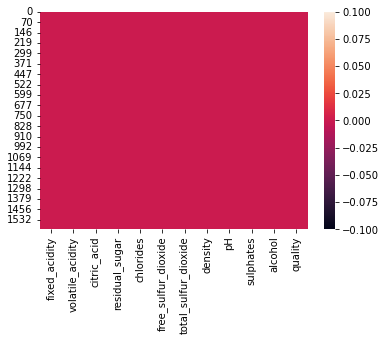

In [11]:
sns.heatmap(df.isnull())

OBSERVATION:
- Thesre are no null values present in the Dataset

In [12]:
# checking information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1359 non-null   float64
 1   volatile_acidity      1359 non-null   float64
 2   citric_acid           1359 non-null   float64
 3   residual_sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free_sulfur_dioxide   1359 non-null   float64
 6   total_sulfur_dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


OBSERVATION:
- there are all columns Dtype is float64 except quality column
- quality column Dtype is int64
- memory usage by dataset is  138.0 KB
- there are not any null values present in this dataset

In [13]:
# Describing the Dataset
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


OBSERVATION:
- The dataset contains 1359 rows and 12 columns.
- The "fixed acidity" column has a mean value of 8.310596 and a standard deviation of 1.736990.
- The range of values for "fixed acidity" is from 4.6 to 15.9.
- The other chemical properties also exhibit varying means, standard deviations, minimum, and maximum values.
- The "quality" column ranges from 3 to 8, representing the quality rating of the wine.
- The dataset provides insights into the distribution and characteristics of the wine dataset, aiding the understanding of the range and variability of different chemical properties.
- The variability in acidity, as indicated by the "fixed acidity" column, can be a significant factor in determining the taste, quality, and overall characteristics of the wine.    

In [14]:
#checking skewness
df.apply(skew)

fixed_acidity           0.940002
volatile_acidity        0.728474
citric_acid             0.312380
residual_sugar          4.543132
chlorides               5.496412
free_sulfur_dioxide     1.225225
total_sulfur_dioxide    1.538667
density                 0.044728
pH                      0.231776
sulphates               2.403848
alcohol                 0.858892
quality                 0.192194
dtype: float64

OBSERVATION:
- The "residual sugar" and "chlorides" variables exhibit high positive skewness, as their skewness values are 4.543132 and 5.496412, respectively. This indicates that the distribution of these variables is skewed to the right, with a longer tail on the positive side.
- The "free sulfur dioxide" and "total sulfur dioxide" variables also show positive skewness, with skewness values of 1.225225 and 1.538667, respectively. This suggests that these variables have a moderate right-skewed distribution.
- The "sulphates" variable demonstrates positive skewness with a skewness value of 2.403848, indicating a right-skewed distribution.
- The "fixed acidity" and "volatile acidity" variables have positive skewness, although their skewness values are relatively lower at 0.940002 and 0.728474, respectively. This suggests a slight right-skewness in their distributions.
- The "pH" and "quality" variables exhibit minimal skewness, with skewness values of 0.231776 and 0.192194, respectively. This suggests that their distributions are approximately symmetric.
- The "citric acid", "density", and "alcohol" variables have very low skewness values, close to zero. This indicates that their distributions are approximately symmetric or very close to being symmetrical.

In [15]:
# checking unique values
df.nunique()

fixed_acidity            96
volatile_acidity        143
citric_acid              80
residual_sugar           91
chlorides               153
free_sulfur_dioxide      60
total_sulfur_dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
dtype: int64

OBSERVATION:
- The "fixed acidity" column has 96 unique values.
- The "volatile acidity" column has 143 unique values, indicating a wider range of variation compared to the "fixed acidity" column.
- The "citric acid" column has 80 unique values, suggesting a relatively smaller range of variation compared to the previous two columns.
- The "residual sugar" column has 91 unique values, indicating a moderate range of variation.
- The "chlorides" column has 153 unique values, indicating a wide range of variation.
- The "free sulfur dioxide" column has 60 unique values, suggesting a relatively smaller range of variation.
- The "total sulfur dioxide" column has 144 unique values, indicating a moderate range of variation.
- The "density" column has 436 unique values, indicating a wide range of variation.
- The "pH" column has 89 unique values, suggesting a relatively smaller range of variation.
- The "sulphates" column has 96 unique values, similar to the "fixed acidity" column.
- The "alcohol" column has 65 unique values, suggesting a moderate range of variation.
- The "quality" column has 6 unique values, indicating a discrete variable representing different quality ratings.

In [16]:
# value_count of quality column
df['quality'].value_counts()

5    577
6    535
7    167
4     53
8     17
3     10
Name: quality, dtype: int64

OBSERVATION:
- The  dataset exhibits an imbalance in the distribution of quality ratings, with a majority of observations concentrated in higher quality ratings (5, 6, and 7) and fewer occurrences in lower quality ratings (4, 3, and 8).

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
VISUALIZATION
</span>

</font>

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Pairplot
</span>

</font>

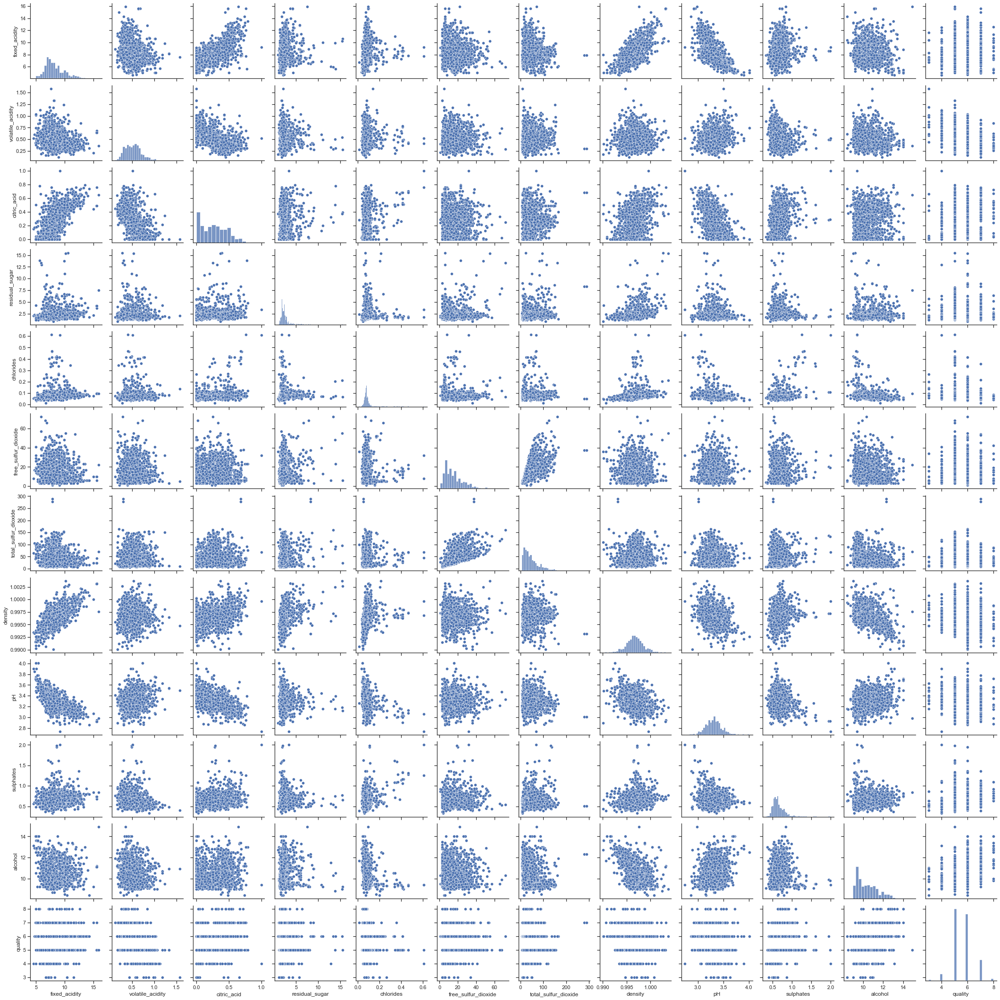

In [17]:
sns.set(style='ticks')
sns.pairplot(df)
plt.show()

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Plotly Countplot For all columns for Better Visualization 
</span>

</font>

In [18]:
# plotly count plot
for column in df.columns:
    fig = px.histogram(df, x=column)
    fig.update_layout(title=f"Count Plot of {column}", xaxis_title=column, yaxis_title="Count")
    fig.show()


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Pyplot For Quality Column
</span>

</font>

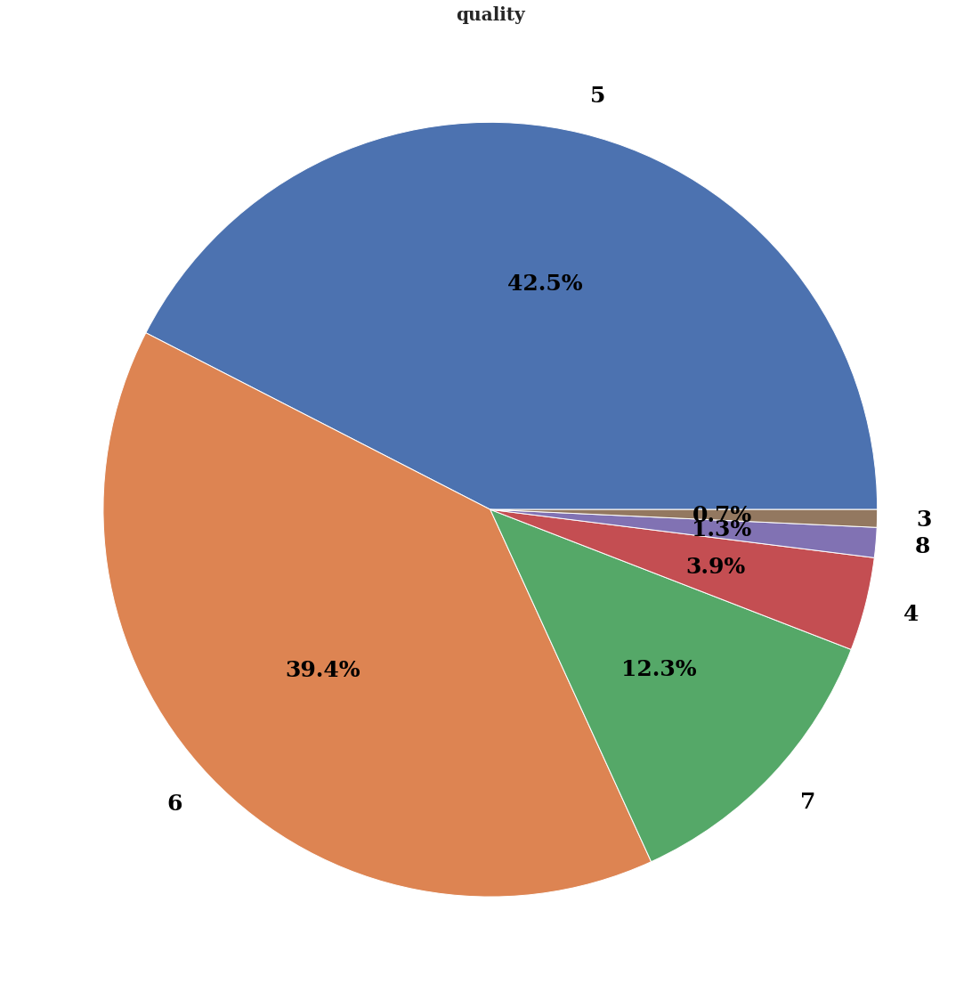

In [19]:
# checking distribution of quality with pyplot
plt.figure(figsize=(30,20)) 
plt.pie(df['quality'].value_counts(), labels=df['quality'].value_counts().index, autopct='%1.1f%%', textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' }) 
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('quality', size=20, **hfont) 
plt.show()

OBSERVATION:

- The dataset exhibits an imbalance in the distribution of quality ratings, with a majority of observations concentrated in higher quality ratings (5, 6, and 7) and fewer occurrences in lower quality ratings (4, 3, and 8).

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting CountPlot for quality column 
</span>

</font>

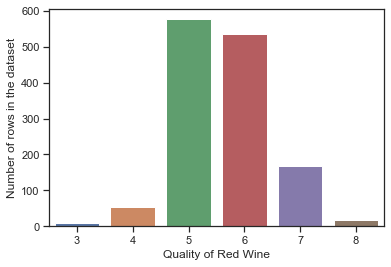

In [20]:
sns.countplot(x ='quality', data = df)
plt.xlabel('Quality of Red Wine')
plt.ylabel('Number of rows in the dataset')
plt.show()

OBSERVATION OF PYPLOT AND COUNTPLOT OF QUALITY COLUMN:

- The dataset exhibits an imbalance in the distribution of quality ratings, with a majority of observations concentrated in higher quality ratings (5, 6, and 7) and fewer occurrences in lower quality ratings (4, 3, and 8).


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Distribution Plot for all the columns
</span>

</font>

In [21]:

for column in df.columns:
    fig = ff.create_distplot([df[column]], [column], bin_size=0.5, show_rug=False)

    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Density"
    )

    fig.show()


OBSERVATION:
- There is low skewness in 'PH','quality','citric acid','density','volatile acidity' and all other columns are right skewed

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Removing Skewness by Cube Root Transformation
</span>

</font>

In [22]:
# Specify the columns to transform
columns_to_transform = ['fixed_acidity', 'volatile_acidity',  'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 
        'sulphates']

# Apply cube root transformation to the selected columns
df[columns_to_transform] = df[columns_to_transform].apply(lambda x: np.cbrt(x))


df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,3.239612,0.99780,3.51,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,4.061548,0.99680,3.20,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,3.779763,0.99700,3.26,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,3.914868,0.99800,3.16,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,3.419952,0.99780,3.51,0.824257,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,1.894536,0.852702,0.08,1.238562,0.408166,3.036589,3.361975,0.99651,3.42,0.935990,9.5,6
1594,1.837091,0.843433,0.08,1.259921,0.448140,3.174802,3.530348,0.99490,3.45,0.833955,10.5,5
1595,1.806969,0.819321,0.10,1.300591,0.395789,3.391211,3.708430,0.99512,3.52,0.912581,11.2,6
1597,1.806969,0.864012,0.12,1.259921,0.421716,3.174802,3.530348,0.99547,3.57,0.892112,10.2,5


In [23]:
for column in df.columns:
    fig = ff.create_distplot([df[column]], [column], bin_size=0.5, show_rug=False)

    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Density"
    )

    fig.show()

OBSERVATION:
- All the columns that were right skewed we have brought them closer to the normal distribution by cube root transformation .    

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotiing Boxplot for Checking Outliers
</span>

</font>

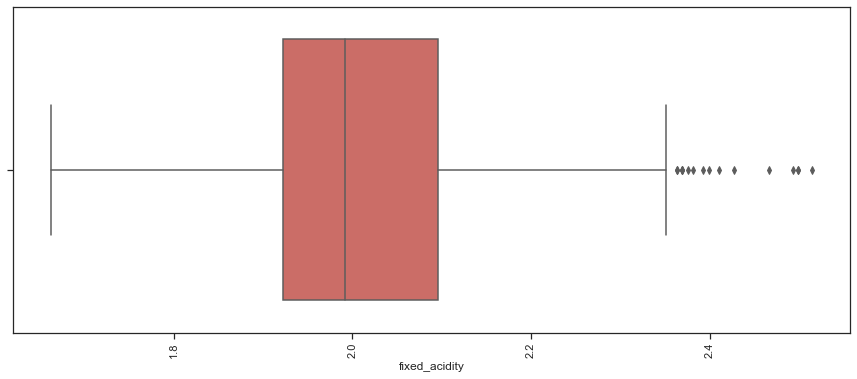

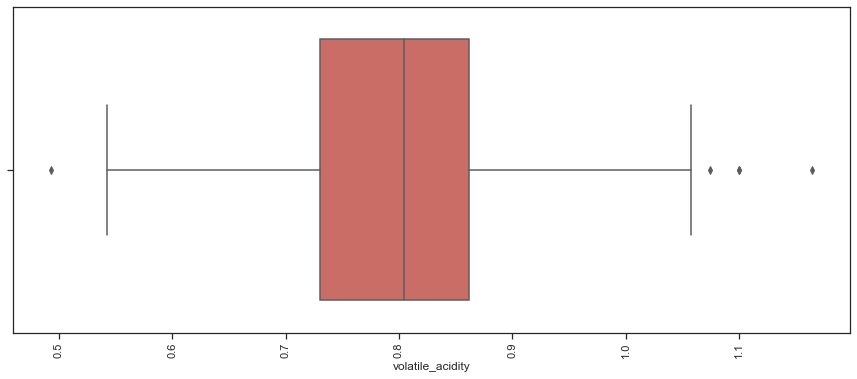

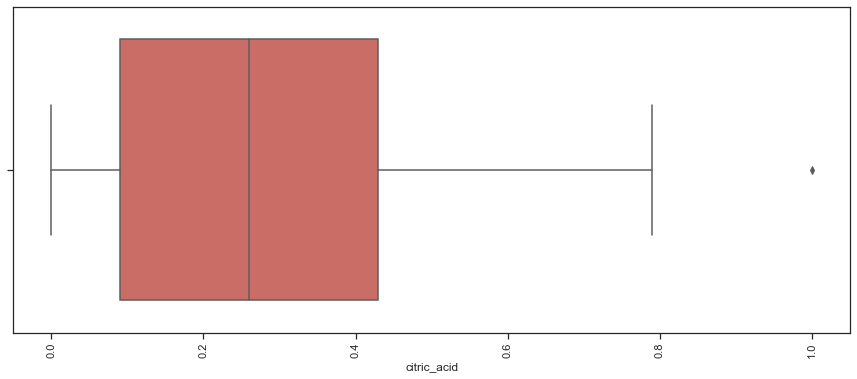

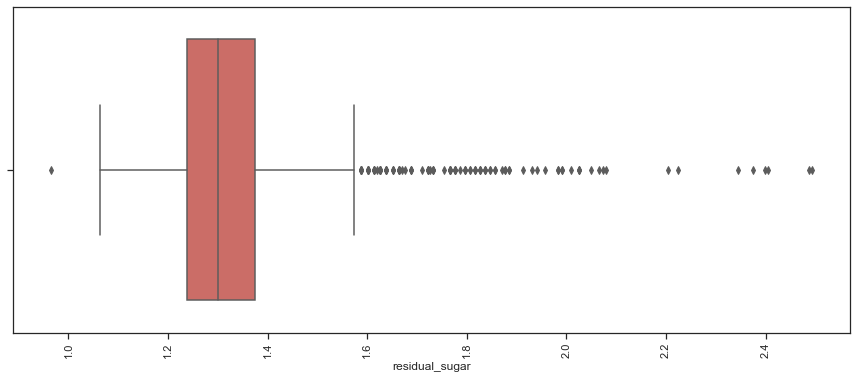

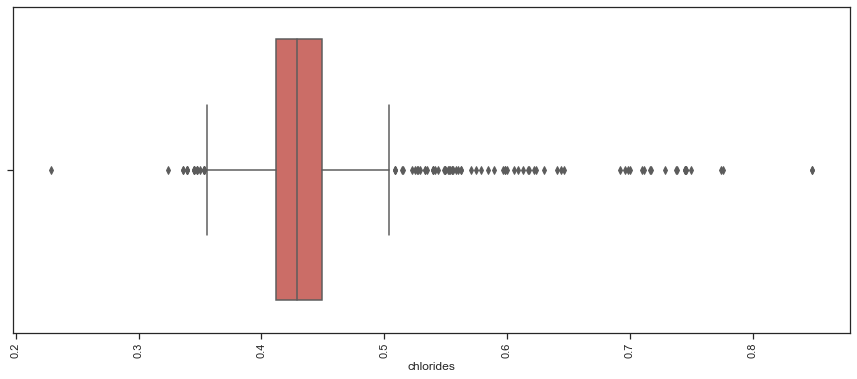

...

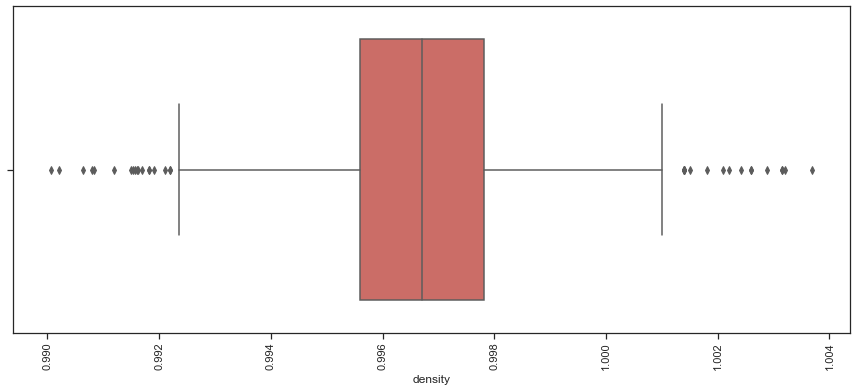

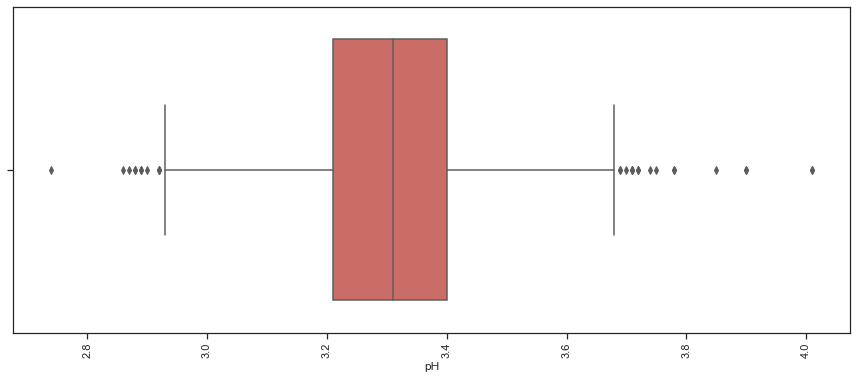

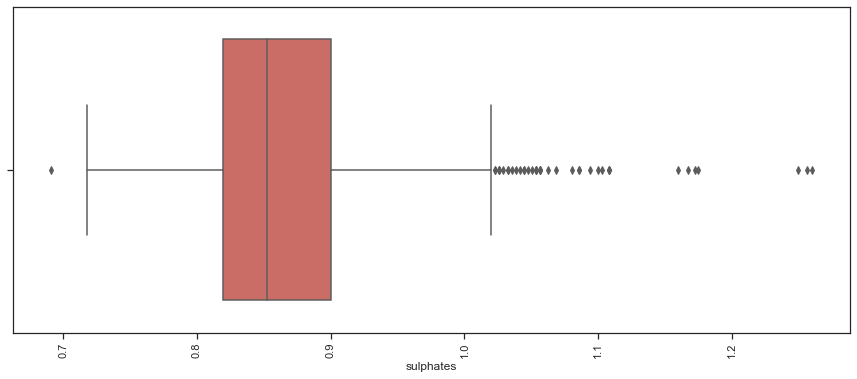

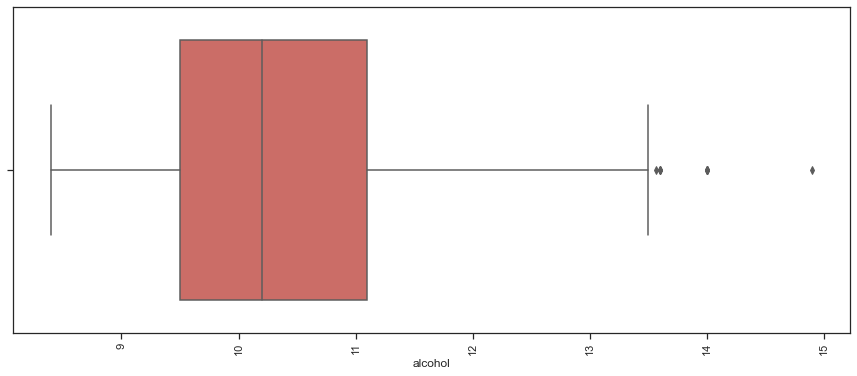

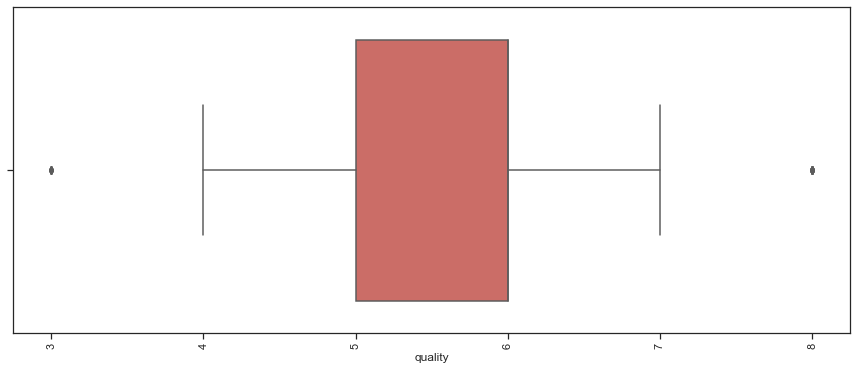

In [24]:
for i in df.columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(df[i], data = df, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

OBSERVATION:
- There are some outliers present in almost all columns we have to handle them for better prediction

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Handling Outliers Using Z score
</span>

</font>

In [25]:
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

df=df[(z<3).all(axis=1)]
df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,3.239612,0.99780,3.51,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,4.061548,0.99680,3.20,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,3.779763,0.99700,3.26,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,3.914868,0.99800,3.16,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,3.419952,0.99780,3.51,0.824257,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,1.894536,0.852702,0.08,1.238562,0.408166,3.036589,3.361975,0.99651,3.42,0.935990,9.5,6
1594,1.837091,0.843433,0.08,1.259921,0.448140,3.174802,3.530348,0.99490,3.45,0.833955,10.5,5
1595,1.806969,0.819321,0.10,1.300591,0.395789,3.391211,3.708430,0.99512,3.52,0.912581,11.2,6
1597,1.806969,0.864012,0.12,1.259921,0.421716,3.174802,3.530348,0.99547,3.57,0.892112,10.2,5


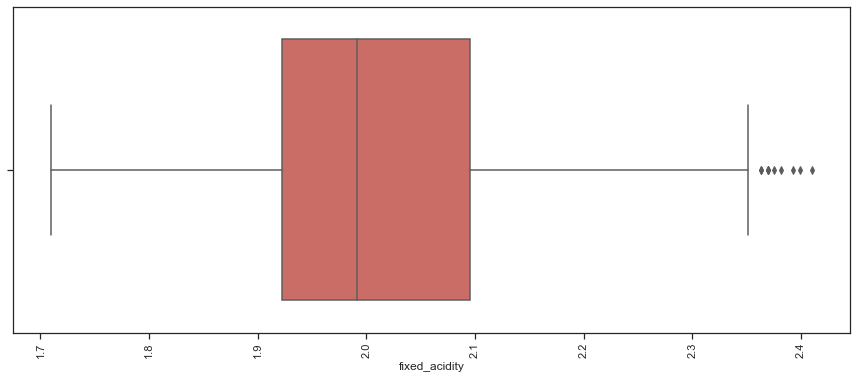

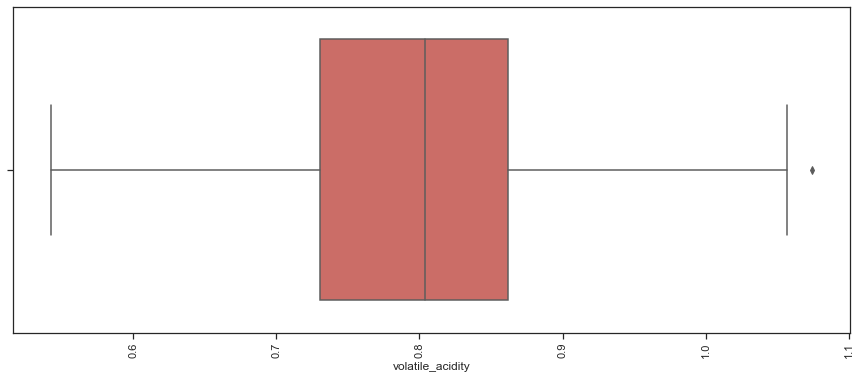

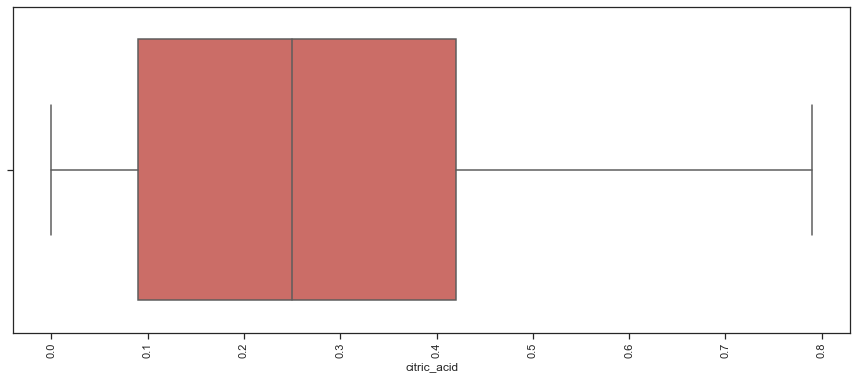

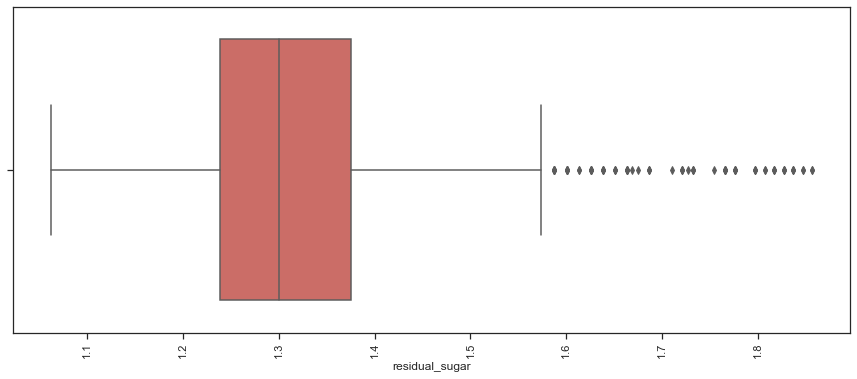

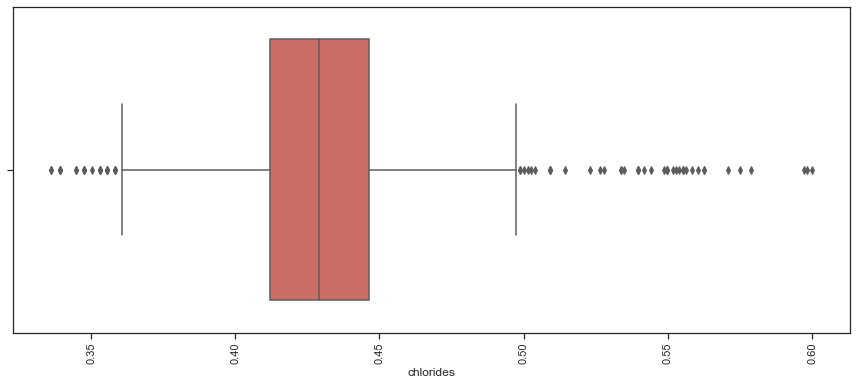

...

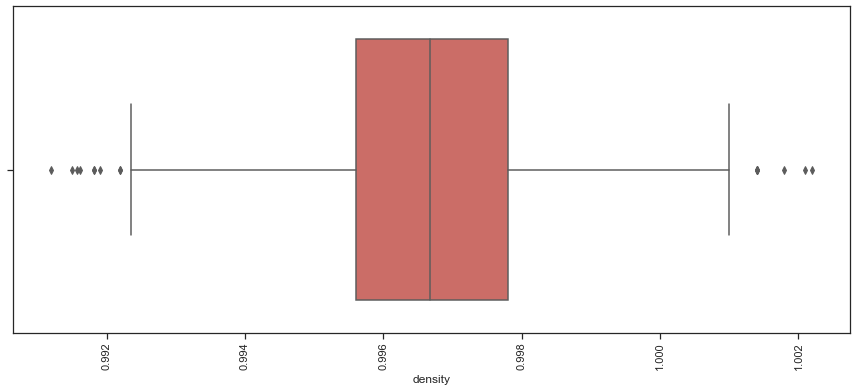

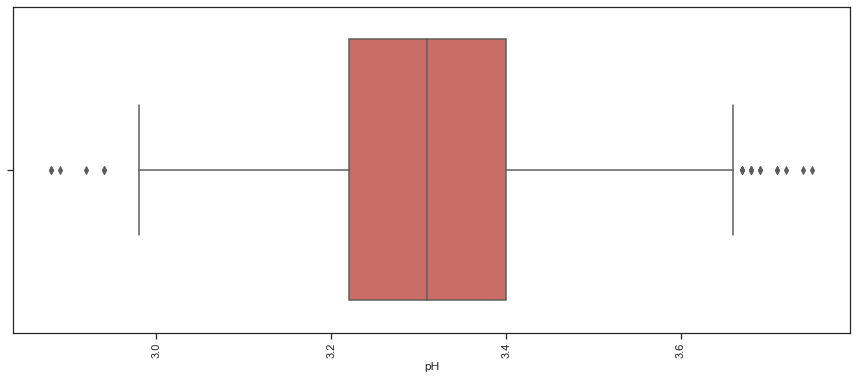

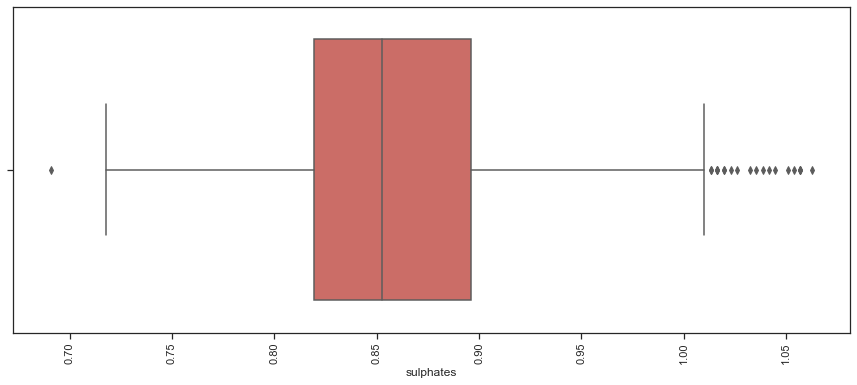

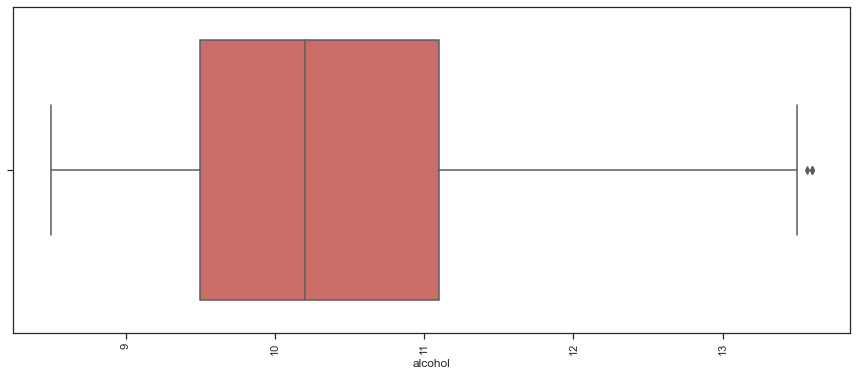

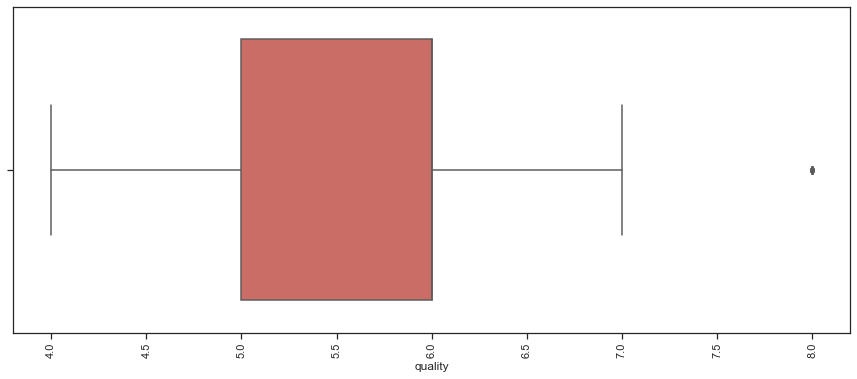

In [26]:
for i in df.columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(df[i], data = df, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

OBSERVATION:
- we have reduced the outliers with the help of Z Score

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Checking Correlation
</span>

</font>

In [27]:
#schecking correlation
df_corr = df.corr()
df_corr

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.289972,0.690966,0.205839,0.199276,-0.148897,-0.092473,0.669176,-0.718759,0.216631,-0.036810,0.140731
volatile_acidity,-0.289972,1.000000,-0.586711,0.048431,0.135916,0.029119,0.122163,0.018287,0.249050,-0.331314,-0.223373,-0.379191
citric_acid,0.690966,-0.586711,1.000000,0.173398,0.084503,-0.088228,-0.004232,0.362982,-0.531726,0.315501,0.158970,0.246903
residual_sugar,0.205839,0.048431,0.173398,1.000000,0.192686,0.027935,0.098093,0.373642,-0.090034,0.067676,0.137654,0.034331
chlorides,0.199276,0.135916,0.084503,0.192686,1.000000,-0.000452,0.112009,0.368570,-0.197363,0.025628,-0.256930,-0.161784
free_sulfur_dioxide,-0.148897,0.029119,-0.088228,0.027935,-0.000452,1.000000,0.754455,-0.021641,0.104242,0.039955,-0.108406,-0.075608
total_sulfur_dioxide,-0.092473,0.122163,-0.004232,0.098093,0.112009,0.754455,1.000000,0.138214,-0.009247,-0.012765,-0.283042,-0.218200
density,0.669176,0.018287,0.362982,0.373642,0.368570,-0.021641,0.138214,1.000000,-0.324757,0.156166,-0.477571,-0.170918
pH,-0.718759,0.249050,-0.531726,-0.090034,-0.197363,0.104242,-0.009247,-0.324757,1.000000,-0.058710,0.142764,-0.080126
sulphates,0.216631,-0.331314,0.315501,0.067676,0.025628,0.039955,-0.012765,0.156166,-0.058710,1.000000,0.237466,0.386120


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Heatmap
</span>

</font>

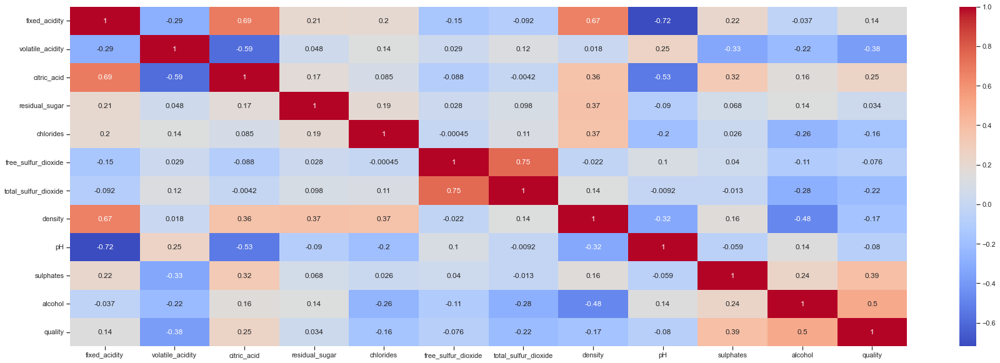

In [28]:
plt.figure(figsize=(30, 10))
sns.heatmap(df_corr, annot=True, cmap='coolwarm')
plt.show()

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Heatmap
</span>

</font>

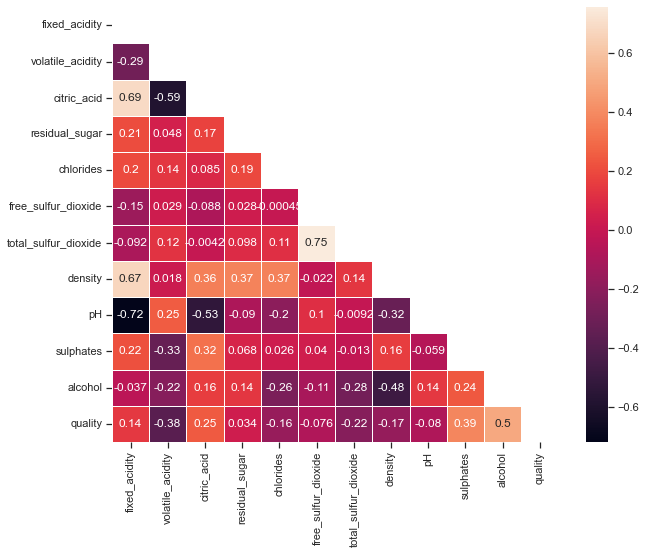

In [29]:
plt.figure(figsize=(10, 8))
matrix = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket");
plt.show()

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Checking Correlation of all features with Target Column
</span>

</font>

In [30]:
correlation_with_quality = df.corr()['quality'].abs().sort_values(ascending=False)
print(correlation_with_quality)

quality                 1.000000
alcohol                 0.500876
sulphates               0.386120
volatile_acidity        0.379191
citric_acid             0.246903
total_sulfur_dioxide    0.218200
density                 0.170918
chlorides               0.161784
fixed_acidity           0.140731
pH                      0.080126
free_sulfur_dioxide     0.075608
residual_sugar          0.034331
Name: quality, dtype: float64


OBSERVATION:
- Here all the columns have good Correlation with quality column    

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Checking Correlation of Column with Column
</span>

</font>

In [31]:
df_corr

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.289972,0.690966,0.205839,0.199276,-0.148897,-0.092473,0.669176,-0.718759,0.216631,-0.036810,0.140731
volatile_acidity,-0.289972,1.000000,-0.586711,0.048431,0.135916,0.029119,0.122163,0.018287,0.249050,-0.331314,-0.223373,-0.379191
citric_acid,0.690966,-0.586711,1.000000,0.173398,0.084503,-0.088228,-0.004232,0.362982,-0.531726,0.315501,0.158970,0.246903
residual_sugar,0.205839,0.048431,0.173398,1.000000,0.192686,0.027935,0.098093,0.373642,-0.090034,0.067676,0.137654,0.034331
chlorides,0.199276,0.135916,0.084503,0.192686,1.000000,-0.000452,0.112009,0.368570,-0.197363,0.025628,-0.256930,-0.161784
free_sulfur_dioxide,-0.148897,0.029119,-0.088228,0.027935,-0.000452,1.000000,0.754455,-0.021641,0.104242,0.039955,-0.108406,-0.075608
total_sulfur_dioxide,-0.092473,0.122163,-0.004232,0.098093,0.112009,0.754455,1.000000,0.138214,-0.009247,-0.012765,-0.283042,-0.218200
density,0.669176,0.018287,0.362982,0.373642,0.368570,-0.021641,0.138214,1.000000,-0.324757,0.156166,-0.477571,-0.170918
pH,-0.718759,0.249050,-0.531726,-0.090034,-0.197363,0.104242,-0.009247,-0.324757,1.000000,-0.058710,0.142764,-0.080126
sulphates,0.216631,-0.331314,0.315501,0.067676,0.025628,0.039955,-0.012765,0.156166,-0.058710,1.000000,0.237466,0.386120


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Here i am writing a function for seeing those columns which are highly correlated with other columns
</span>

</font>

In [32]:
correlation_threshold = 0.7
mask = df_corr.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_corr.columns)):
    for j in range(i+1, len(df_corr.columns)):
        if mask.iloc[i, j]:
            colname_i = df_corr.columns[i]
            colname_j = df_corr.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [33]:
features_to_drop

{'pH', 'total_sulfur_dioxide'}

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Dropping 'PH' and 'total sulfur dioxide' 
</span>

</font>

In [34]:
df = df.drop(['pH', 'total_sulfur_dioxide'], axis = 1)

Observation:
- 'PH' and 'total sulphur dioxide' are highly correlated with other columns so we are deleting both of them    

In [35]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,5


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Assigning values >=7 to 1 and rest values to 0
</span>

</font>

In [36]:
df['quality_final'] = np.where(df['quality'] >= 7, 1, 0)


OBSERVATION:
- Here we have created a new column 'quality_final' basis on the 'quality' column in which we have set the value >=  7 to 1 and rest to 0   

In [37]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality,quality_final
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,5,0
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,5,0
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,5,0
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,6,0
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,5,0


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Dropping Quality Column Beacause i have created a new column quality_final in place of quality
</span>

</font>

In [38]:
df = df.drop(['quality'], axis = 1)

In [39]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,0
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,0
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,0
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,0
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,0


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting Pyplot for quality_final Column
</span>

</font>

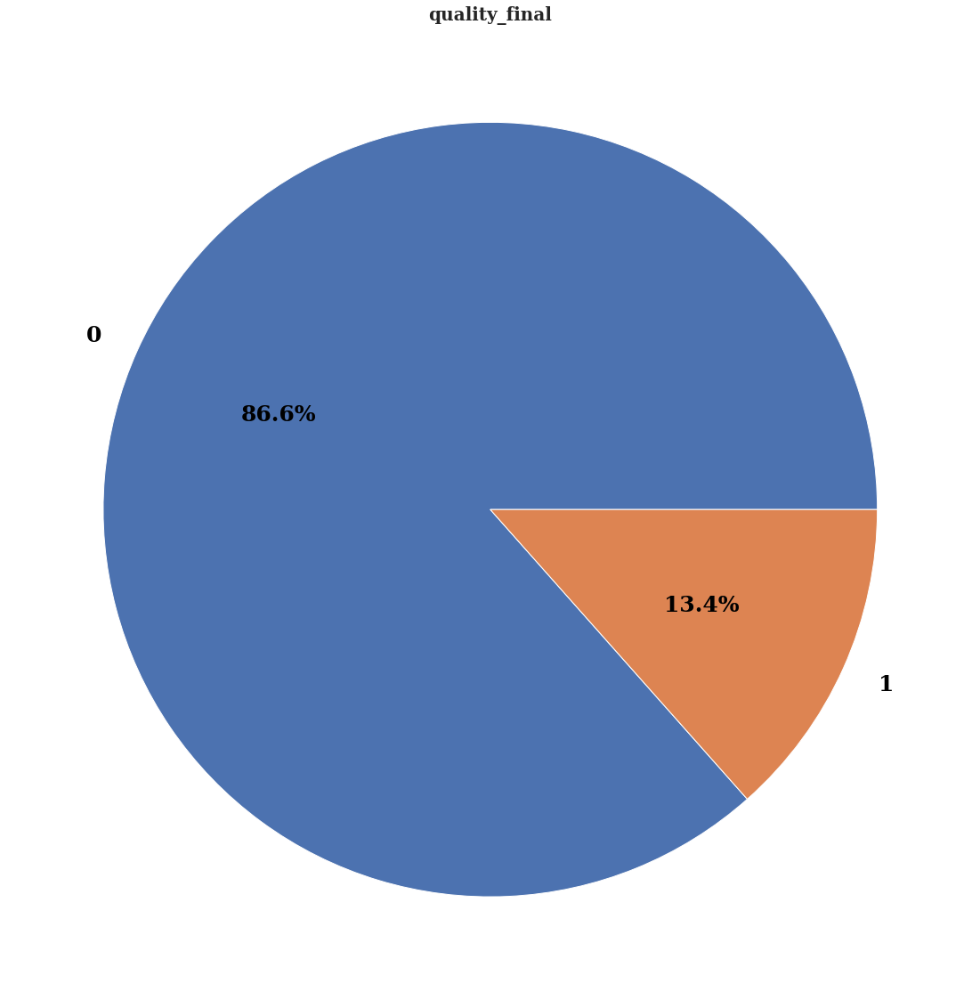

In [40]:
# checking distribution of quality with pyplot
plt.figure(figsize=(30,20)) 
plt.pie(df['quality_final'].value_counts(), labels=df['quality_final'].value_counts().index, autopct='%1.1f%%', textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' }) 
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('quality_final', size=20, **hfont) 
plt.show()

OBSERVATION:
- here 86.6% values are 0 and 13.4% are 1 . Looking at this it shows that our data is imbalanced

<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Plotting BarPlot for Alcohol and quality_final
</span>

</font>

In [41]:
fig = px.bar(df, x='quality_final', y='alcohol', labels={'quality_final': 'Quality of Red Wine', 'alcohol': 'Alcohol'},
             title='Comparison of Alcohol by Quality', template='plotly_dark')


fig.show()

In [42]:
df.head(2)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
0,1.948695,0.887904,0.0,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,0
1,1.983192,0.958284,0.0,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,0


<font face="cursive" size="2">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Checking value_counts of quality_final
</span>

</font>

In [43]:
df['quality_final'].value_counts()

0    1088
1     169
Name: quality_final, dtype: int64

OBSERVATION:
- data is imbalanced    

In [44]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'density', 'sulphates', 'alcohol',
       'quality_final'],
      dtype='object')

In [45]:
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
count,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000
mean,2.017098,0.797785,0.266046,1.322204,0.430879,2.387355,0.996681,0.859773,10.424238,0.134447
std,0.131420,0.091168,0.190700,0.133312,0.034880,0.525709,0.001740,0.057678,1.034817,0.341268
min,1.709976,0.542884,0.000000,1.062659,0.336198,1.000000,0.991200,0.691042,8.500000,0.000000
25%,1.921997,0.730614,0.090000,1.238562,0.412129,1.912931,0.995600,0.819321,9.500000,0.000000
50%,1.991632,0.804145,0.250000,1.300591,0.429084,2.351335,0.996680,0.852702,10.200000,0.000000
75%,2.095379,0.861774,0.420000,1.375069,0.446475,2.758924,0.997800,0.896281,11.100000,0.000000
max,2.410142,1.074337,0.790000,1.856636,0.600000,3.848501,1.002200,1.062659,13.600000,1.000000


OBSERVATION:
- for seing this it is clear that for "citric acid","chlorides" and "quality_final" there is no need to scaling because they are already in between 0 and 1

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Scaling data Using StandardScaler
</span>

</font>

In [46]:
scaler = StandardScaler()
features_to_scale =['fixed_acidity', 'volatile_acidity', 'residual_sugar', 'free_sulfur_dioxide', 'density', 'sulphates', 'alcohol']
scaled_features = scaler.fit_transform(df[features_to_scale])
scaled_df = df.copy()
scaled_df[features_to_scale] = scaled_features

In [47]:
scaled_df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
0,-0.520695,0.988890,0.00,-0.627665,0.423582,-0.310894,0.643254,-0.616013,-0.990170,0
1,-0.258095,1.761182,0.00,0.396706,0.461044,1.021242,0.068316,0.339832,-0.603475,0
2,-0.258095,1.259670,0.04,-0.016496,0.451436,0.150061,0.183303,0.112152,-0.603475,0
3,1.676814,-1.575439,0.56,-0.627665,0.421716,0.350003,0.758241,-0.447804,-0.603475,0
5,-0.520695,0.799655,0.00,-0.793672,0.421716,-0.068545,0.643254,-0.616013,-0.990170,0
...,...,...,...,...,...,...,...,...,...,...
1593,-0.932962,0.602611,0.08,-0.627665,0.408166,1.235460,-0.098416,1.321961,-0.893496,0
1594,-1.370252,0.500899,0.08,-0.467385,0.448140,1.498472,-1.024066,-0.447804,0.073242,0
1595,-1.599544,0.236320,0.10,-0.162187,0.395789,1.910288,-0.897580,0.915928,0.749960,0
1597,-1.599544,0.726722,0.12,-0.467385,0.421716,1.498472,-0.696352,0.560911,-0.216779,0


<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Deviding into Feature and Label
</span>

</font>

In [48]:
X = scaled_df.drop('quality_final', axis = 1)
y = scaled_df['quality_final']

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Data Balancing Using SMOTE
</span>

</font>

In [49]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

In [50]:
y_resampled.value_counts()

0    1088
1    1088
Name: quality_final, dtype: int64

OBSERVATION:
- now the data looks balanced

In [51]:
X_resampled.head(2)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol
0,-0.520695,0.988890,0.0,-0.627665,0.423582,-0.310894,0.643254,-0.616013,-0.990170
1,-0.258095,1.761182,0.0,0.396706,0.461044,1.021242,0.068316,0.339832,-0.603475


<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Train Test Split
</span>

</font>

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify = y_resampled, random_state=42)

<font face="cursive" size="6">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Model Training
</span>

</font>

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Logistic Regression with Hyperparameter Tuning
</span>

</font>

Logistic Regression with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.78      0.82       218
           1       0.80      0.89      0.84       218

    accuracy                           0.83       436
   macro avg       0.83      0.83      0.83       436
weighted avg       0.83      0.83      0.83       436

Cross-Validation Scores: [0.87301587 0.8452381  0.89243028 0.85657371 0.89243028]
Mean Cross-Validation Score: 0.8719376462404351


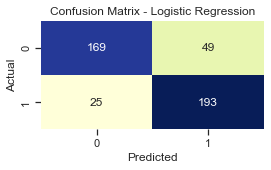

In [53]:
# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# Create the Logistic Regression Classifier
LG = LogisticRegression()

# Create the grid search object
grid_search = GridSearchCV(LG, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Logistic Regression Classifier with the best parameters
best_LG = LogisticRegression(**best_params)

# Fit the model on the training data
best_LG.fit(X_train, y_train)

# Make predictions on the test set
LG_y_pred = best_LG.predict(X_test)

print("Logistic Regression with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, LG_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_LG, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, LG_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#### ROC AUC SCORE

In [54]:
y_prob = best_LG.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.8933170608534636


#### ROC Curve

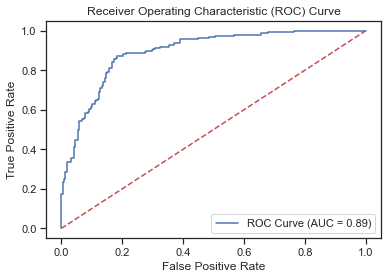

In [55]:
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Decision Tree Classifier with Hyperparameter Tuning
</span>

</font>

Decision Tree Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.84      0.89       218
           1       0.86      0.94      0.90       218

    accuracy                           0.89       436
   macro avg       0.90      0.89      0.89       436
weighted avg       0.90      0.89      0.89       436

Cross-Validation Scores: [0.88095238 0.79761905 0.84462151 0.79681275 0.83665339]
Mean Cross-Validation Score: 0.8313318155947638


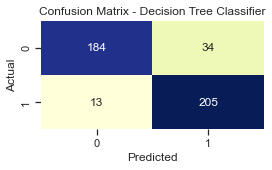

In [56]:
# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Decision Tree Classifier
dt = DecisionTreeClassifier()

# Create the grid search object
grid_search = GridSearchCV(dt, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Decision Tree Classifier with the best parameters
best_dt = DecisionTreeClassifier(**best_params)

# Fit the model on the training data
best_dt.fit(X_train, y_train)

# Make predictions on the test set
dt_y_pred = best_dt.predict(X_test)

print("Decision Tree Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, dt_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_dt, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, dt_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Decision Tree Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#### ROC AUC Score

In [57]:
y_prob = best_dt.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.8583452571332378


#### ROC Curve

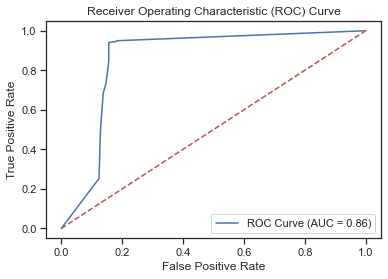

In [58]:
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Random Forest Classifier with Hyperparameter Tuning
</span>

</font>

Random Forest Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.87      0.91       218
           1       0.88      0.97      0.92       218

    accuracy                           0.92       436
   macro avg       0.92      0.92      0.92       436
weighted avg       0.92      0.92      0.92       436

Cross-Validation Scores: [0.88888889 0.84126984 0.8685259  0.86055777 0.8685259 ]
Mean Cross-Validation Score: 0.8655536583823438


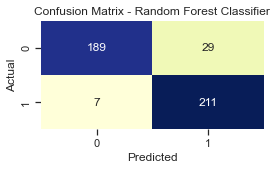

In [59]:
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Random Forest Classifier
RF = RandomForestClassifier()

# Create the grid search object
grid_search = GridSearchCV(RF, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Random Forest Classifier with the best parameters
best_RF = RandomForestClassifier(**best_params)

# Fit the model on the training data
best_RF.fit(X_train, y_train)

# Make predictions on the test set
RF_y_pred = best_RF.predict(X_test)

print("Random Forest Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, RF_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_RF, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, RF_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Random Forest Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#### ROC AUC Score

In [60]:
y_prob = best_RF.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.98033625115731


#### ROC Curve

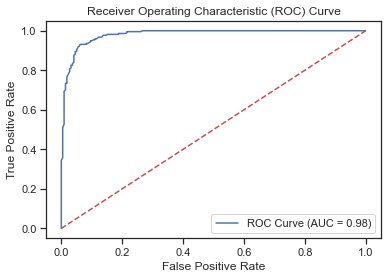

In [61]:
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
K Neighbour Classifier with Hyperparameter Tuning
</span>

</font>

K Neighbors Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.81      0.89       218
           1       0.84      1.00      0.91       218

    accuracy                           0.90       436
   macro avg       0.92      0.90      0.90       436
weighted avg       0.92      0.90      0.90       436

Cross-Validation Scores: [0.89285714 0.84920635 0.86454183 0.80876494 0.85657371]
Mean Cross-Validation Score: 0.8543887940302284


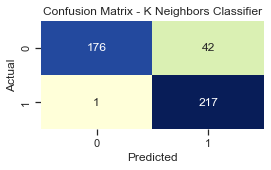

In [62]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# Create the K Neighbors Classifier
KN = KNeighborsClassifier()

# Create the grid search object
grid_search = GridSearchCV(KN, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the K Neighbors Classifier with the best parameters
best_KN = KNeighborsClassifier(**best_params)

# Fit the model on the training data
best_KN.fit(X_train, y_train)

# Make predictions on the test set
KN_y_pred = best_KN.predict(X_test)

print("K Neighbors Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, KN_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_KN, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, KN_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - K Neighbors Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


#### ROC AUC Score

In [63]:
y_prob = best_KN.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9511825603905396


#### ROC Curve

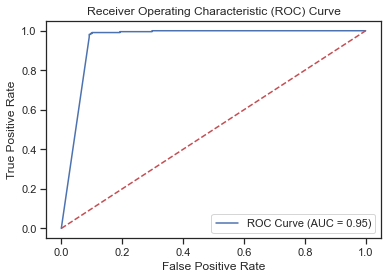

In [64]:
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Extra Tree Classifier with Hyperparameter Tuning
</span>

</font>

Extra Tree Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       218
           1       0.91      0.97      0.94       218

    accuracy                           0.93       436
   macro avg       0.94      0.93      0.93       436
weighted avg       0.94      0.93      0.93       436

Cross-Validation Scores: [0.88492063 0.8452381  0.87250996 0.8685259  0.88446215]
Mean Cross-Validation Score: 0.8711313476253716


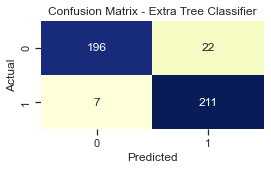

In [65]:
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Extra Trees Classifier
ET = ExtraTreesClassifier()

# Create the grid search object
grid_search = GridSearchCV(ET, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_


# Create the Extra Trees Classifier with the best parameters
best_ET = ExtraTreesClassifier(**best_params)

# Fit the model on the training data
best_ET.fit(X_train, y_train)

# Make predictions on the test set
ET_y_pred = best_ET.predict(X_test)

print("Extra Tree Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, ET_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_ET, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, ET_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Extra Tree Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#### ROC AUC Score

In [66]:
y_prob = best_ET.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9876378250988974


#### ROC Curve

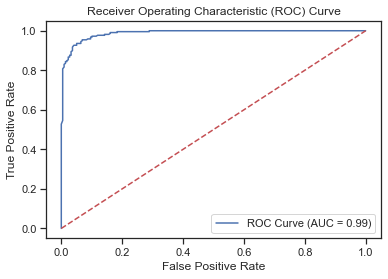

In [67]:

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Support Vector Classifier with Hyperparameter Tuning
</span>

</font>

Support Vector Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.84      0.90       218
           1       0.86      0.97      0.91       218

    accuracy                           0.91       436
   macro avg       0.91      0.91      0.91       436
weighted avg       0.91      0.91      0.91       436

Cross-Validation Scores: [0.89285714 0.84920635 0.88047809 0.84860558 0.87649402]
Mean Cross-Validation Score: 0.869528236261304


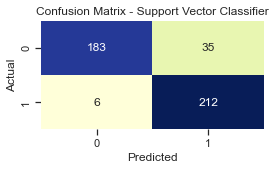

In [68]:
# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Create the SVC
SV = SVC()

# Create the grid search object
grid_search = GridSearchCV(SV, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the SVC with the best parameters
best_SV = SVC(**best_params)

# Fit the model on the training data
best_SV.fit(X_train, y_train)

# Make predictions on the test set
SV_y_pred = best_SV.predict(X_test)

print("Support Vector Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, SV_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_SV, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, SV_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Support Vector Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#### ROC AUC Score

In [69]:
y_prob = best_SV.decision_function(X_test)

# Compute ROC AUC score
auc_score = roc_auc_score(y_test, y_prob)

print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9574951603400387


#### ROC Curve

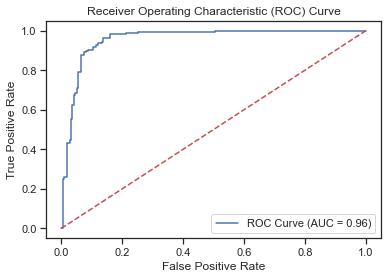

In [70]:

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
XGBoost Classifier with Hyperparameter Tuning
</span>

</font>


XGBoost Classifier :
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       218
           1       0.89      0.96      0.92       218

    accuracy                           0.92       436
   macro avg       0.92      0.92      0.92       436
weighted avg       0.92      0.92      0.92       436

Cross-Validation Scores: [0.84579061 0.8077442  0.87003058 0.84182705 0.82176742]
Mean Cross-Validation Score: 0.8374319719009238


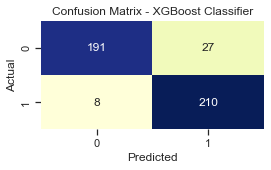

In [71]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Create the XGBoost classifier
XGB = XGBClassifier()

# Create the grid search object
grid_search = GridSearchCV(XGB, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the XGBoost classifier with the best parameters
best_XGB = XGBClassifier(**best_params)

# Fit the model on the training data and make prediction on test data
best_XGB.fit(X_train, y_train)
XGB_y_pred = best_XGB.predict(X_test)


print("XGBoost Classifier :")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, XGB_y_pred))


# Cross-Validation Score
scores = cross_val_score(best_XGB, X, y, cv=5, scoring='roc_auc')
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, XGB_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - XGBoost Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


#### ROC AUC Score

In [72]:
y_prob = best_XGB.predict_proba(X_test)[:, 1]

# Compute ROC AUC score
auc_score = roc_auc_score(y_test, y_prob)

print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9774008921807928


#### ROC Curve

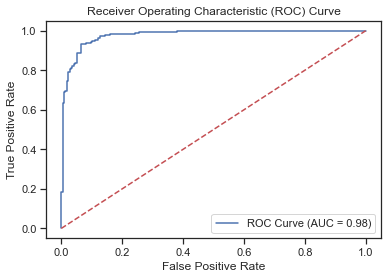

In [73]:

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Creating DataFrame of All the Models in Their descending Order
</span>

</font>

In [74]:
# Create a list of model names
model_names = ['Extra Tree Classifier', 'Support Vector Classifier', 'K Neighbour Classifier', 'Random Forest Classifier', 'Decision Tree Classifier', 'Logistic Regression','XGBoost Classifier']

# Create a list of models and their corresponding accuracy scores
models = [ET, SV, KN, RF, dt, LG]
accuracy_scores = [accuracy_score(y_test, ET_y_pred), accuracy_score(y_test, SV_y_pred), accuracy_score(y_test, KN_y_pred), accuracy_score(y_test, RF_y_pred), accuracy_score(y_test, dt_y_pred), accuracy_score(y_test, LG_y_pred),accuracy_score(y_test, XGB_y_pred)]

# Create a dataframe with model name and accuracy score
df = pd.DataFrame({'Model Name': model_names, 'Accuracy Score': accuracy_scores})

# Sort the dataframe by accuracy score in descending order
df = df.sort_values('Accuracy Score', ascending=False)

# Print the dataframe
df.index = range(1, len(df)+1)
print(df)


                  Model Name  Accuracy Score
1      Extra Tree Classifier        0.933486
2         XGBoost Classifier        0.919725
3   Random Forest Classifier        0.917431
4  Support Vector Classifier        0.905963
5     K Neighbour Classifier        0.901376
6   Decision Tree Classifier        0.892202
7        Logistic Regression        0.830275


<font face="cursive" size="4">

<span style="background-color:rgb(255, 255, 0); padding: 10px;">
Save Best Model
</span>

</font>

In [75]:
filename = 'Extra_tree_classifier.pkl'
pickle.dump(ET, open(filename, 'wb'))

<font face="cursive" size="8">
<span style="background-color:rgb(255, 255, 0); padding: 10px; text-align: center; display: block;">
PROJECT COMPLETED
</span>
</font>